Researcher - TRISHUL CHOWDHURY

In [ ]:
import pandas as pd
df = pd.read_csv('amazon_200.csv')

In [131]:
import plotly.graph_objs as go
import chart_studio.plotly as py
import plotly.figure_factory as ff

In [132]:
from plotly.offline import iplot
import cufflinks
import plotly.figure_factory as ff
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

import pandas as pd
import numpy as np
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings 
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
import scattertext as st
import spacy
from pprint import pprint
import en_core_web_sm

Loading BokehJS ...

In [133]:
import en_core_web_sm
nlp = en_core_web_sm.load()

In [5]:
df.shape

(34660, 21)

In [6]:
df.head(2)

,id,name,asins,brand,categories,keys,manufacturer,reviews.date,reviews.dateAdded,reviews.dateSeen,reviews.didPurchase,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username
0,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",NaN,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,This product so far has not disappointed. My c...,Kindle,NaN,NaN,Adapter
1,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",NaN,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,great for beginner or experienced person. Boug...,very fast,NaN,NaN,truman


In [7]:
df.columns

Index(['id', 'name', 'asins', 'brand', 'categories', 'keys', 'manufacturer',
       'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'reviews.doRecommend', 'reviews.id',
       'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs',
       'reviews.text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username'],
      dtype='object')

In [7]:
## Basic Preprocessing for LSA 
def preprocess(ReviewText):
    ReviewText = ReviewText.str.replace("(<br/>)", "")
    ReviewText = ReviewText.str.replace('(<a).*(>).*(</a>)', '')
    ReviewText = ReviewText.str.replace('(&amp)', '')
    ReviewText = ReviewText.str.replace('(&gt)', '')
    ReviewText = ReviewText.str.replace('(&lt)', '')
    ReviewText = ReviewText.str.replace('(\xa0)', ' ')  
    return ReviewText

In [8]:
df['reviews.text'] = preprocess(df['reviews.text'])
df['reviews.text']=df['reviews.text'].astype(str)

In [9]:
## Creating important features for Topic modelling tasks
df['polarity'] = df['reviews.text'].map(lambda text: TextBlob(text).sentiment.polarity)
df['review_len'] = df['reviews.text'].astype(str).apply(len)
df['word_count'] = df['reviews.text'].apply(lambda x: len(str(x).split()))

In [27]:
## POLARITY
print('5 random reviews with the highest positive sentiment polarity: \n')
cl = df.loc[df.polarity == 1, ['reviews.text']].sample(5).values
for c in cl:
    print(c[0])


5 random reviews with the highest positive sentiment polarity: 

Great purchase!!!! Allowed me to cut my cable off!
The Amazon Fire TV was an excellent purchase. I do not regret canceling cable TV. Streaming Hulu, Showtime, Netflix when I want. You can't beat it.
Got it for my grandson he loves it.it is a very good tablet!!!
You can read books as well as browse the internet. It has cameras too.. Good buy and a recommended gift!!
Perfect for teens as well as adults who loves to read and watch movies


In [12]:
print('5 random reviews with the most neutral sentiment(zero) polarity: \n')
cl = df.loc[df.polarity == -1, ['reviews.text']].sample(5).values
for c in cl:
    print(c[0])

5 random reviews with the most neutral sentiment(zero) polarity: 

Works just as well as my Rokus, however the interface is completely awful. Buy the fire for kodi buy a roku for everything else.
We are a Kindle family! Use them all the time! Reading books, checking email, watching Netflix. Would be very sad without it!!!
Bought it so my son would stop grabbing for my phone. Does what it needs to but battery life is horrible
Goodbye outrageous satellite bills...hello Amazon!
I thought the Firestick was the way to go but the lack of buffering from the tv box is all i need to watch everything with no worry of it stopping or cutting off, if you don't have one you need to get one asap!!!!


In [13]:
df.polarity.min()

-1.0

In [15]:
## Most negative polarity
df.loc[df.polarity == -1].head(5)

,id,name,asins,brand,categories,keys,manufacturer,reviews.date,reviews.dateAdded,reviews.dateSeen,reviews.didPurchase,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,polarity,review_len,word_count
2543,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-06T00:00:00.000Z,2017-05-21T06:04:05Z,"2017-04-30T00:45:00.000Z,2017-06-07T09:03:00.000Z",NaN,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,We are a Kindle family! Use them all the time!...,Love Kindle!,NaN,NaN,Tobey,-1.0,127,22
6608,AVphgVaX1cnluZ0-DR74,"Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes...",B018Y229OU,Amazon,"Fire Tablets,Tablets,Computers & Tablets,All T...",firetablet7displaywifi8gbincludesspecialoffers...,Amazon,2016-04-08T00:00:00.000Z,2017-05-21T01:18:45Z,"2017-04-30T00:08:00.000Z,2017-06-07T08:19:00.000Z",NaN,True,NaN,0.0,3.0,http://reviews.bestbuy.com/3545/5025800/review...,Bought it so my son would stop grabbing for my...,Cheap but works,NaN,NaN,Jpplease,-1.0,104,21
8556,AVphgVaX1cnluZ0-DR74,"Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes...",B018Y229OU,Amazon,"Fire Tablets,Tablets,Computers & Tablets,All T...",firetablet7displaywifi8gbincludesspecialoffers...,Amazon,2017-02-24T00:00:00.000Z,2017-05-21T01:29:25Z,"2017-04-30T00:10:00.000Z,2017-06-07T08:14:00.000Z",NaN,False,NaN,0.0,3.0,http://reviews.bestbuy.com/3545/5025800/review...,One of the worst purchases or investments you ...,Very slow processor,NaN,NaN,sAris,-1.0,72,12
21739,AV1YnR7wglJLPUi8IJmi,"Echo (White),,,\r\nEcho (White),,,",B00TSUGXKE,Amazon,"Electronics Features,Fire Tablets,Computers & ...","amazon/b00tsugxke,0848719062854,firetablet7dis...",Amazon,2017-07-14T00:00:00.000Z,NaN,"2017-08-09T00:00:00Z,2017-08-06T00:00:00Z,2017...",NaN,False,NaN,0.0,3.0,http://reviews.bestbuy.com/3545/4390200/review...,"i got this tablet for traveling. Just games, r...",It's ok,NaN,NaN,Rookie,-1.0,166,31
30272,AV1YE_muvKc47QAVgpwE,NaN,B00U3FPN4U,Amazon Fire Tv,"Back To College,College Electronics,College Tv...","848719057492,amazonfiretv/51454342,amazonfiret...",Amazon,2016-08-14T00:00:00.000Z,2017-09-20T05:35:59Z,"2017-08-25T22:40:17.288Z,2017-08-19T09:25:16.7...",NaN,True,NaN,1.0,5.0,http://reviews.bestbuy.com/3545/4370400/review...,I thought the Firestick was the way to go but ...,Fast for the quick draw!!,NaN,NaN,IVIStax,-1.0,213,45


In [16]:
print('2 reviews with the most negative polarity: \n')
cl = df.loc[df.polarity == -1, ['reviews.text']].sample(2).values
for c in cl:
    print(c[0])

2 reviews with the most negative polarity: 

I thought the Firestick was the way to go but the lack of buffering from the tv box is all i need to watch everything with no worry of it stopping or cutting off, if you don't have one you need to get one asap!!!!
One of the worst purchases or investments you could make for technology.


In [17]:
## Plotting EDA

In [10]:
product_polarity_sorted=pd.DataFrame(df.groupby('name')['polarity'].mean().sort_values(ascending=True))
a=product_polarity_sorted.nlargest(5,"polarity")

<Figure size 1152x576 with 0 Axes>

Text(0.5, 0, 'Polarity')

Text(0, 0.5, 'Products')

Text(0.5, 1.0, 'Polarity of Different Amazon Product Reviews')

Text(0.005, 0.29166666666666674, 'Fire HD 8 Tablet with Alexa, 8 HD Display, 16 GB, Tangerine - with Special Offers,')

Text(0.005, 1.1717261904761904, 'Certified Refurbished Amazon Fire TV (Previous Generation - 1st),,,\r\nCertified Refurbished Amazon Fire TV (Previous Generation - 1st),,,')

Text(0.005, 2.1444444444444444, 'Amazon Kindle Touch Leather Case (4th Generation - 2011 Release), Olive Green,,,\r\nAmazon Kindle Touch Leather Case (4th Generation - 2011 Release), Olive Green,,,')

Text(0.005, 3.1, 'Coconut Water Red Tea 16.5 Oz (pack of 12),,,\r\nAmazon Fire Tv,,,')

Text(0.005, 4.1, 'New Amazon Kindle Fire Hd 9w Powerfast Adapter Charger + Micro Usb Angle Cable,,,\r\n')

Text(0.6926666666666668, 0.29166666666666674, '0.692')

Text(0.5727261904761904, 1.1717261904761904, '0.572')

Text(0.5454444444444444, 2.1444444444444444, '0.544')

Text(0.501, 3.1, '0.500')

Text(0.501, 4.1, '0.500')

([], [])

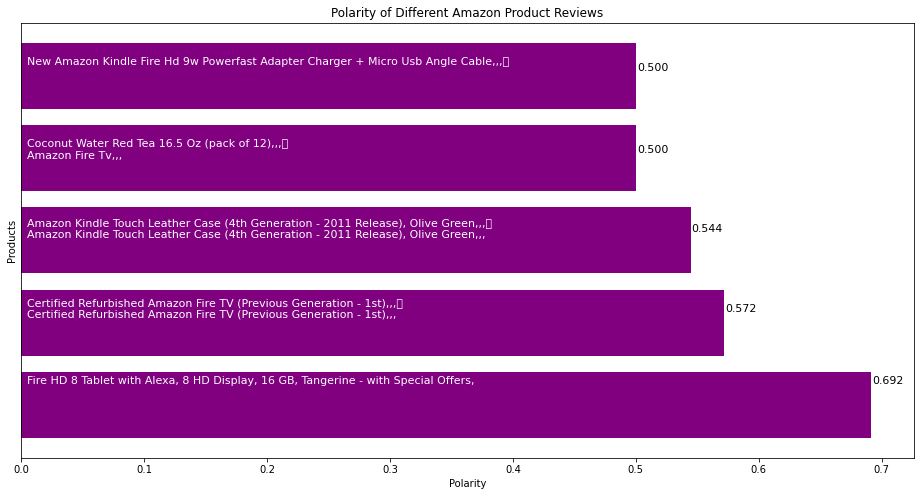

In [11]:
plt.figure(figsize=(16,8))
plt.xlabel('Polarity')
plt.ylabel('Products')
plt.title('Polarity of Different Amazon Product Reviews')
polarity_graph=plt.barh(np.arange(len(a.index)),a['polarity'],color='purple',)

# Writing product names on bar
for bar,product in zip(polarity_graph,a.index):
    plt.text(0.005,bar.get_y()+bar.get_width(),'{}'.format(product),va='center',fontsize=11,color='white')

# Writing polarity values on graph
for bar,polarity in zip(polarity_graph,a['polarity']):
    plt.text(bar.get_width()+0.001,bar.get_y()+bar.get_width(),'%.3f'%polarity,va='center',fontsize=11,color='black')
plt.yticks([])
plt.show()

In [12]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [13]:
df['reviews.rating'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [14]:
## Review text length analysys 

df['review_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Review Text Length Distribution')

In [38]:
## 2D Density Jointplot of Sentiment Polarity vs. Rating

In [15]:
trace1 = go.Scatter(
    x=df['polarity'], y=df['reviews.rating'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)
trace2 = go.Histogram2dContour(
    x=df['polarity'], y=df['reviews.rating'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)
trace3 = go.Histogram(
    x=df['polarity'], name='Sentiment polarity density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)
trace4 = go.Histogram(
    y=df['reviews.rating'], name='Rating density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)
data = [trace1, trace2, trace3, trace4]

layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=600,
    height=550,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='2dhistogram-2d-density-plot-subplots')

In [16]:
x1 = df.loc[df['reviews.doRecommend'] == 1, 'polarity']
x0 = df.loc[df['reviews.doRecommend'] == 0 , 'polarity']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

In [45]:
#It is obvious that reviews have higher polarity score are more likely to be recommended.

#Apparently, the polarity score for recommended reviews is higher than the polarity score for not recommended reviews.

In [17]:
x1 = df.loc[df['reviews.doRecommend'] == 1, 'reviews.rating']
x0 = df.loc[df['reviews.doRecommend'] == 0, 'reviews.rating']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

In [36]:
(pd.DataFrame(df["brand"].value_counts())).to_excel("brands.xlsx")

In [35]:
## The distribution of  brands
df.groupby('brand').count()['id'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Class Name', xTitle='brands')

In [37]:
df.columns

Index(['id', 'name', 'asins', 'brand', 'categories', 'keys', 'manufacturer',
       'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'reviews.doRecommend', 'reviews.id',
       'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs',
       'reviews.text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username', 'polarity', 'review_len',
       'word_count'],
      dtype='object')

In [51]:
#The distribution of top unigrams after removing stop words


def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['reviews.text'], 20)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['reviews.text' , 'count'])
df2.groupby('reviews.text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', textposition='outside',linecolor='black', title='Top 20 words in review after removing stop words')


great 11873
tablet 9089
use 7703
love 6645
easy 6223
amazon 5906
kindle 5414
good 5092
bought 5062
price 4200
like 3840
product 3590
tv 3328
works 3115
just 3082
echo 2944
read 2801
music 2783
alexa 2724
kids 2701


In [78]:
df2 = pd.DataFrame(common_words, columns = ['reviews.text' , 'count'])

In [79]:
df2

,reviews.text,count
0,great,11873
1,tablet,9089
2,use,7703
3,love,6645
4,easy,6223
5,amazon,5906
6,kindle,5414
7,good,5092
8,bought,5062
9,price,4200


In [80]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   reviews.text  20 non-null     object
 1   count         20 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 448.0+ bytes


In [83]:
#The distribution of Top trigrams after removing stop words
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(4, 4), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(df['reviews.text'], 20)
for word, freq in common_words:
    print(word, freq)
df6 = pd.DataFrame(common_words, columns = ['reviews.text' , 'count'])
df6.groupby('reviews.text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 trigrams in review after removing stop words')

easy set easy use 53
bought tablet year old 38
year old son loves 34
great product great price 30
battery lasts long time 30
year old daughter loves 30
watch movies play games 27
play games watch movies 27
play games read books 26
great tablet great price 26
great product easy use 26
read books play games 26
tablet year old son 24
love tablet easy use 23
works great easy use 23
bought year old loves 22
bought year old son 21
play games watch videos 21
year old grandson loves 19
tablet year old daughter 18


<Figure size 2160x576 with 0 Axes>

Text(0, 15, '11873')

Text(0, 15, '9089')

Text(0, 15, '7703')

Text(0, 15, '6645')

Text(0, 15, '6223')

Text(0, 15, '5906')

Text(0, 15, '5414')

Text(0, 15, '5092')

Text(0, 15, '5062')

Text(0, 15, '4200')

Text(0, 15, '3840')

Text(0, 15, '3590')

Text(0, 15, '3328')

Text(0, 15, '3115')

Text(0, 15, '3082')

Text(0, 15, '2944')

Text(0, 15, '2801')

Text(0, 15, '2783')

Text(0, 15, '2724')

Text(0, 15, '2701')

Text(0.5, 0, 'Words')

Text(0, 0.5, 'Count')

Text(0.5, 1.0, 'Top 20 words in the review after removing the stop words')

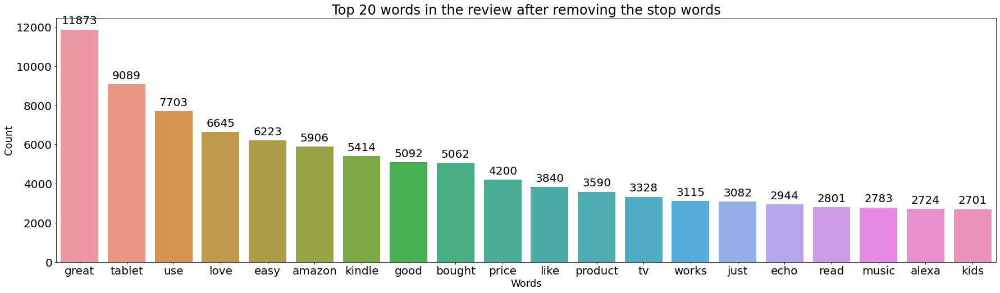

In [81]:
# Defining the plot size 
plt.figure(figsize=(30,8)) 
  
# Defining the values for x-axis, y-axis 
# and from which datafarme the values are to be picked 
plots = sns.barplot(x=df2["reviews.text"], y=df2["count"], data=df2) 

plt.rcParams.update({'font.size': 20})

  
# Iterrating over the bars one-by-one 
for bar in plots.patches: 
    
  # Using Matplotlib's annotate function and 
  # passing the coordinates where the annotation shall be done 
  # x-coordinate: bar.get_x() + bar.get_width() / 2 
  # y-coordinate: bar.get_height() 
  # free space to be left to make graph pleasing: (0, 8) 
  # ha and va stand for the horizontal and vertical alignment 
    plots.annotate(format(bar.get_height(), '.0f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=20, xytext=(0, 15), 
                   textcoords='offset points'
                  ) 
#Setting the label for x-axis 
plt.xlabel("Words", size=18) 
  
# Setting the label for y-axis 
plt.ylabel("Count", size=18) 
  
# Setting the title for the graph 
plt.title("Top 20 words in the review after removing the stop words") 
  
# Fianlly showing the plot 
plt.show() 

In [86]:
df6.rename(columns={"reviews.text":"Top trigrams of the review text"},inplace=True)

In [87]:
df6.to_excel("trigram.xlsx")

In [90]:
a=pd.DataFrame(df["categories"].value_counts())
a

,categories
"Fire Tablets,Tablets,Computers & Tablets,All Tablets,Electronics, Tech Toys, Movies, Music,Electronics,iPad & Tablets,Android Tablets,Frys",10966
"Stereos,Remote Controls,Amazon Echo,Audio Docks & Mini Speakers,Amazon Echo Accessories,Kitchen & Dining Features,Speaker Systems,Electronics,TVs Entertainment,Clearance,Smart Hubs & Wireless Routers,Featured Brands,Wireless Speakers,Smart Home & Connected Living,Home Security,Kindle Store,Home Automation,Home, Garage & Office,Home,Voice-Enabled Smart Assistants,Virtual Assistant Speakers,Portable Audio & Headphones,Electronics Features,Amazon Device Accessories,iPod, Audio Player Accessories,Home & Furniture Clearance,Consumer Electronics,Smart Home,Surveillance,Home Improvement,Smart Home & Home Automation Devices,Smart Hubs,Home Safety & Security,Voice Assistants,Alarms & Sensors,Amazon Devices,Audio,Holiday Shop",6619
"Back To College,College Electronics,College Tvs & Home Theater,Electronics,Tvs & Home Theater,Streaming Devices,Featured Brands,Amazon Devices,Holiday Shop,Ways To Shop,TV & Home Theater,Streaming Media Players,All Streaming Media Players,TVs Entertainment,Video Games,Kindle Store,Electronics Features,Kids & Family,Fire TV",5056
"Walmart for Business,Office Electronics,Tablets,Office,Electronics,iPad & Tablets,Windows Tablets,All Windows Tablets,Computers & Tablets,E-Readers & Accessories,E-Readers,eBook Readers,Kindle E-readers,Computers/Tablets & Networking,Tablets & eBook Readers,Electronics Features,Books & Magazines,Book Accessories,eReaders,TVs & Electronics,Computers & Laptops,Tablets & eReaders",3176
"Electronics,iPad & Tablets,All Tablets,Fire Tablets,Tablets,Computers & Tablets",2814
"Tablets,Fire Tablets,Computers & Tablets,All Tablets",1699
"Computers/Tablets & Networking,Tablets & eBook Readers,Computers & Tablets,Tablets,All Tablets",1038
"Featured Brands,Electronics,Amazon Devices,Home,Home Improvement,Home Safety & Security,Home Security,Alarms & Sensors,Smart Home & Home Automation Devices,Mobile,Mobile Speakers,Mobile Bluetooth Speakers,Smart Hubs & Wireless Routers,Smart Hubs,Home, Garage & Office,Smart Home,Voice Assistants,Smart Home & Connected Living,Amazon Tap,Portable Audio,MP3 Accessories,Speakers,Amazon Echo,Electronics Features,TVs & Electronics,Portable Audio & Electronics,MP3 Player Accessories,Home Theater & Audio,Kindle Store,Frys,Electronic Components,Home Automation,Electronics, Tech Toys, Movies, Music,Audio,Bluetooth Speakers",636
"Walmart for Business,Office Electronics,Tablets,Electronics,iPad & Tablets,All Tablets,Computers & Tablets,E-Readers & Accessories,Kindle E-readers,Electronics Features,eBook Readers,See more Amazon Kindle Voyage (Wi-Fi),See more Amazon Kindle Voyage 4GB, Wi-Fi 3G (Unlocked...",580
"Amazon Devices & Accessories,Amazon Device Accessories,Power Adapters & Cables,Kindle Store,Kindle E-Reader Accessories,Kindle Paperwhite Accessories",402


In [48]:
#Recommended reviews have higher ratings than otherwise.

In [21]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['reviews.text'], 20)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['reviews.text' , 'count'])

the 44316
it 35086
and 33956
to 33863
for 26431
is 20887
this 17718
my 17399
great 11873
of 11129
with 9517
tablet 9089
you 8554
on 8452
have 8178
that 7872
use 7703
in 7211
but 6863
love 6645


In [20]:
df.columns

Index(['id', 'name', 'asins', 'brand', 'categories', 'keys', 'manufacturer',
       'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'reviews.doRecommend', 'reviews.id',
       'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs',
       'reviews.text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username', 'polarity', 'review_len',
       'word_count'],
      dtype='object')

In [22]:
x1 = df.loc[df['reviews.doRecommend'] == 1, 'review_len']
x0 = df.loc[df['reviews.doRecommend'] == 0, 'review_len']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode = 'group', title='Distribution of Review Lengths Based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='stacked histogram')

In [96]:
blob = TextBlob(str(df['reviews.text']))
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:20]
pos_df.iplot(
    kind='bar',
    xTitle='POS',
    yTitle='count', 
    title='Top 20 Part-of-speech tagging for review corpus')

In [97]:
pos_df

NN      14
CD      13
NNP      9
DT       8
RB       8
PRP      8
IN       8
JJ       7
CC       5
VB       5
VBD      5
VBP      4
PRP$     4
VBN      3
TO       3
VBZ      2
MD       1
RBR      1
NNS      1
WRB      1
Name: pos, dtype: int64

In [23]:
x1 = df.loc[df['reviews.doRecommend'] == 1, 'review_len']
x0 = df.loc[df['reviews.doRecommend'] == 0, 'review_len']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode = 'group', title='Distribution of Review Lengths Based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='stacked histogram')

In [50]:
##Distribution of word count by recommendations

In [24]:

x1 = df.loc[df['reviews.doRecommend'] == 1, 'word_count']
x0 = df.loc[df['reviews.doRecommend'] == 0, 'word_count']

trace1 = go.Histogram(
    x=x0, name='Not recommended',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Recommended',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode = 'group', title='Distribution of Word Count Based on Recommendation')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='grouped histogram')

In [92]:
y0 = df.loc[df['brand'] == 'Amazon']['polarity']
y1 = df.loc[df['brand'] == 'Amazon Coco T']['polarity']
y2 = df.loc[df['brand'] == 'Amazon Digital Services Inc.']['polarity']
y3 = df.loc[df['brand'] == 'Amazon Echo']['polarity']
y4 = df.loc[df['brand'] == 'Amazon Fire']['polarity']
y5 = df.loc[df['brand'] == 'Amazon Fire Tv']['polarity']

trace0 = go.Box(
    y=y0,
    name = 'Amazon',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Amazon Coco T',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Amazon Digital Services Inc.',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Amazon Echo',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Amazon Fire',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)

trace5 = go.Box(
    y=y5,
    name = 'Amazon Fire Tv',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)

data = [trace0, trace1, trace2,trace3,trace4,trace5]
layout = go.Layout(
    title = "Sentiment Polarity Boxplot of Brand Name"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Sentiment Polarity Boxplot of Brands")

In [95]:
y0 = df.loc[df['reviews.doRecommend'] == 1]['review_len']
y1 = df.loc[df['reviews.doRecommend'] == 0]['review_len']


trace0 = go.Box(
    y=y0,
    name = 'TRUE',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'FALSE',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title = "Review length Boxplot of recommendation indicator"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Review Length Boxplot of Department Name")

## LSA START 

In [134]:
df.columns

Index(['id', 'name', 'asins', 'brand', 'categories', 'keys', 'manufacturer',
       'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'reviews.doRecommend', 'reviews.id',
       'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs',
       'reviews.text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username'],
      dtype='object')

In [136]:
reindexed_data = df['reviews.text'].astypepe(str)
tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, smooth_idf=True)
reindexed_data = reindexed_data.values
document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)

In [109]:
type(document_term_matrix)

scipy.sparse.csr.csr_matrix

In [138]:
n_topics = 8
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)

In [139]:
lsa_topic_matrix

array([[ 0.16473825,  0.10109901, -0.03194844, ..., -0.00076234,
         0.04384506,  0.11174519],
       [ 0.16455981, -0.13055109,  0.1886918 , ...,  0.02618428,
        -0.03316631,  0.03503005],
       [ 0.08978799,  0.01379696,  0.01930666, ..., -0.01991005,
         0.05103167, -0.02687436],
       ...,
       [ 0.13198064,  0.04432834,  0.02419276, ...,  0.03523406,
        -0.0823661 , -0.0176479 ],
       [ 0.06565158, -0.00381583, -0.00604052, ..., -0.04903187,
        -0.02491436, -0.03092744],
       [ 0.13080001,  0.00795238, -0.00171286, ..., -0.03824348,
        -0.05577109,  0.00790135]])

In [140]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [141]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [143]:
lsa_categories

[0, 4, 5, 1, 2, 7, 6, 3]

In [145]:
top_n_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  great tablet use
Topic 2:  easy use set
Topic 3:  loves bought gift
Topic 4:  easy tablet use
Topic 5:  great works product
Topic 6:  kindle love read
Topic 7:  love kids echo
Topic 8:  product good recommend


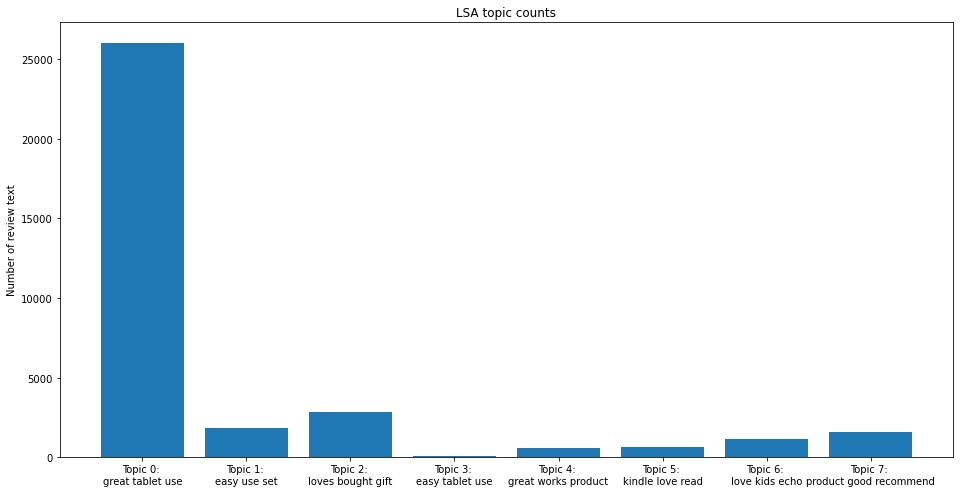

In [147]:
top_3_words = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels);
ax.set_ylabel('Number of review text');
ax.set_title('LSA topic counts');
plt.show();


In [123]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 34660 samples in 0.420s...
[t-SNE] Computed neighbors for 34660 samples in 7.873s...
[t-SNE] Computed conditional probabilities for sample 1000 / 34660
[t-SNE] Computed conditional probabilities for sample 2000 / 34660
[t-SNE] Computed conditional probabilities for sample 3000 / 34660
[t-SNE] Computed conditional probabilities for sample 4000 / 34660
[t-SNE] Computed conditional probabilities for sample 5000 / 34660
[t-SNE] Computed conditional probabilities for sample 6000 / 34660
[t-SNE] Computed conditional probabilities for sample 7000 / 34660
[t-SNE] Computed conditional probabilities for sample 8000 / 34660
[t-SNE] Computed conditional probabilities for sample 9000 / 34660
[t-SNE] Computed conditional probabilities for sample 10000 / 34660
[t-SNE] Computed conditional probabilities for sample 11000 / 34660
[t-SNE] Computed conditional probabilities for sample 12000 / 34660
[t-SNE] Computed conditional probabilities for sa

In [124]:
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        reviews_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                reviews_in_that_topic.append(two_dim_vectors[i])    
        
        reviews_in_that_topic = np.vstack(reviews_in_that_topic)
        mean_review_in_that_topic = np.mean(reviews_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_review_in_that_topic)
    return mean_topic_vectors

In [125]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [126]:
# colormap = np.array([
#     "#02080d"])
# ##colormap = colormap[:n_topics]

In [127]:
top_3_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=1050, plot_height=700)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color="black",text_font_style='bold')
    plot.add_layout(label)
    
show(plot)

GlyphRenderer(id='1038', ...)

In [60]:
df.columns

Index(['id', 'name', 'asins', 'brand', 'categories', 'keys', 'manufacturer',
       'reviews.date', 'reviews.dateAdded', 'reviews.dateSeen',
       'reviews.didPurchase', 'reviews.doRecommend', 'reviews.id',
       'reviews.numHelpful', 'reviews.rating', 'reviews.sourceURLs',
       'reviews.text', 'reviews.title', 'reviews.userCity',
       'reviews.userProvince', 'reviews.username', 'polarity', 'review_len',
       'word_count'],
      dtype='object')

In [64]:
import scattertext as st

In [65]:
#Here are the terms that differentiate the review text from a general English corpus
corpus = st.CorpusFromPandas(df, category_col='brand', text_col='reviews.text', nlp=nlp).build()
print(list(corpus.get_scaled_f_scores_vs_background().index[:10]))

['kindle', 'ipad', 'paperwhite', 'tablet', 'alexa', 'android', 'apps', 'netflix', 'roku', 'youtube']


In [69]:
term_freq_df

,Amazon freq,Amazon Fire freq,Amazon Echo freq,Amazon Coco T freq,Amazon Fire Tv freq,Amazon Digital Services Inc. freq
term,,,,,,
this,14706,139,331,1,2489,30
product,2714,20,64,0,776,6
so,5125,64,119,0,799,10
far,819,10,14,0,182,2
has,3316,32,97,0,631,6
...,...,...,...,...,...,...
ok most,1,0,0,0,0,0
charger back,1,0,0,0,0,0
let anyone,1,0,0,0,0,0


In [73]:
term_freq_df

,Amazon freq,Amazon Fire freq,Amazon Echo freq,Amazon Coco T freq,Amazon Fire Tv freq,Amazon Digital Services Inc. freq
term,,,,,,
this,14706,139,331,1,2489,30
product,2714,20,64,0,776,6
so,5125,64,119,0,799,10
far,819,10,14,0,182,2
has,3316,32,97,0,631,6
...,...,...,...,...,...,...
ok most,1,0,0,0,0,0
charger back,1,0,0,0,0,0
let anyone,1,0,0,0,0,0


In [80]:
## EDA
term_freq_df['Amazon Fire Tv Score'] = corpus.get_scaled_f_scores('Amazon Fire Tv')
print(list(term_freq_df.sort_values(by='Tops Score', ascending=False).index[:10]))

['vue', 'playstation', 'playstation vue', 'tv box', '4 k', 'firestick', 'the stick', '4k', 'fire stick', 'fire tv']


In [81]:
term_freq_df['Amazon Score'] = corpus.get_scaled_f_scores('Amazon')
pprint(list(term_freq_df.sort_values(by='Amazon Score', ascending=False).index[:10]))

['paperwhite',
 'tablet for',
 'reader',
 'e',
 'great tablet',
 'a tablet',
 'this tablet',
 'tablet',
 'to read',
 'light']
